# Cellrank analysis - Germ cells

Run velocity first

```
source activate SCtrajectories


velocyto run10x -m utils/hg38_rmsk.gtf  /nfs/team292/lg18/gonads/data/scRNAseq/FCA/rawdata/FCA_GND8622627_all/ /lustre/scratch117/cellgen/team292/lg18/genes.gtf 


maybe?

velocyto run10x -m utils/hg38_rmsk.gtf  /nfs/team292/lg18/gonads/data/scRNAseq/FCA/rawdata/FCA_GND8622627_all/ /lustre/scratch117/cellgen/cellgeni/cellranger/cellranger-3.1.0/cellranger-tiny-ref/3.0.0/genes/genes.gtf 
```




In [267]:
import scvelo as scv
import scanpy as sc
# import cellrank as cr
import numpy as np
import pandas as pd
import anndata

sc.logging.sinfo()

scv.settings.verbosity = 3
scv.settings.set_figure_params('scvelo')
# cr.settings.verbosity = 2

-----
anndata     0.7.5
numpy       1.20.1
pandas      1.2.3
scanpy      1.7.0rc1
scvelo      0.2.3
-----
IPython             7.21.0
jupyter_client      6.1.11
jupyter_core        4.7.1
jupyterlab          3.0.9
notebook            6.2.0
-----
Python 3.8.8 | packaged by conda-forge | (default, Feb 20 2021, 16:22:27) [GCC 9.3.0]
Linux-4.15.0-112-generic-x86_64-with-glibc2.10
26 logical CPU cores, x86_64
-----
Session information updated at 2021-04-19 09:39


# Load andata

In [268]:
adataALL = scv.read('/nfs/team292/lg18/with_valentina/FCA-M5-annotatedCluster4Seurat.h5ad')

# Filter samples of interest

In [269]:
sample = 'FCA_GND8784460'
adata = adataALL[[i in sample for i in adataALL.obs['sample']]]
adata

View of AnnData object with n_obs × n_vars = 6824 × 28230
    obs: '5v1.1', 'TP', 'batch', 'batch_collection', 'cryopreserved', 'individual', 'location', 'n_counts', 'n_genes', 'percent_mito', 'process', 'sample', 'sex', 'stage', 'PCW', 'sample_source', 'clusters', 'louvain', 'is_doublet', 'scrublet_cluster_score', 'scrublet_score'
    var: 'gene_ids-0', 'feature_types-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'n_cells-8', 'gene_ids-9', 'feature_types-9', 'n_cells-9', 'gene_ids-10', 'feature_types-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'n_cells-11', 'gene_ids-12', 'feature_types-12', 'n_cells-12', 'gene_ids-13', 'feature_types-13', 'n_cells-13', '

In [270]:
annot = pd.read_csv('/nfs/team292/lg18/with_valentina/supporting_annotation_doublets.csv', sep=',', index_col = 0)
set(annot.annotated_clusters)

{'FetalLeydig',
 'Oi-like',
 'Sertoli',
 'Sertoli_WFDC2',
 'Sertoli_cycling',
 'Sertoli_low',
 'coelEpi',
 'coelEpi_cycling',
 'cycling',
 'doublet_I',
 'doublet_II',
 'lowQC_I',
 'lowQC_II',
 'lowQC_III',
 'lowQC_IV',
 'ovarianSurf',
 'preGC_III_GJA1',
 'preGC_II_KITLG',
 'preGC_I_OSR1',
 'sKITLG',
 'sLGR5',
 'sPAX8'}

In [271]:
# Add cell type annotation
annot = annot[["annotated_clusters", "clusters_old"]]
adata = adata[[ i in annot.index for i in adata.obs.index]]
adata.obs = pd.concat([adata.obs, annot[ [i in adata.obs.index for i in annot.index] ]], join='outer', axis=1)
adata = adata[[ i not in ['Oi-like', 'FetalLeydig'] for i in adata.obs.annotated_clusters]]
adata = adata[[ 'lowQC' not in i for i in adata.obs.annotated_clusters]]
adata = adata[[ 'doublet' not in i for i in adata.obs.annotated_clusters]]
adata = adata[[ 'cycling' not in i for i in adata.obs.annotated_clusters]]
adata = adata[[ 'Sertoli' not in i for i in adata.obs.annotated_clusters]]
adata.obs.head()
set(annot.annotated_clusters)

{'FetalLeydig',
 'Oi-like',
 'Sertoli',
 'Sertoli_WFDC2',
 'Sertoli_cycling',
 'Sertoli_low',
 'coelEpi',
 'coelEpi_cycling',
 'cycling',
 'doublet_I',
 'doublet_II',
 'lowQC_I',
 'lowQC_II',
 'lowQC_III',
 'lowQC_IV',
 'ovarianSurf',
 'preGC_III_GJA1',
 'preGC_II_KITLG',
 'preGC_I_OSR1',
 'sKITLG',
 'sLGR5',
 'sPAX8'}

Trying to set attribute `.obs` of view, copying.
... storing 'annotated_clusters' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'clusters_old' as categorical


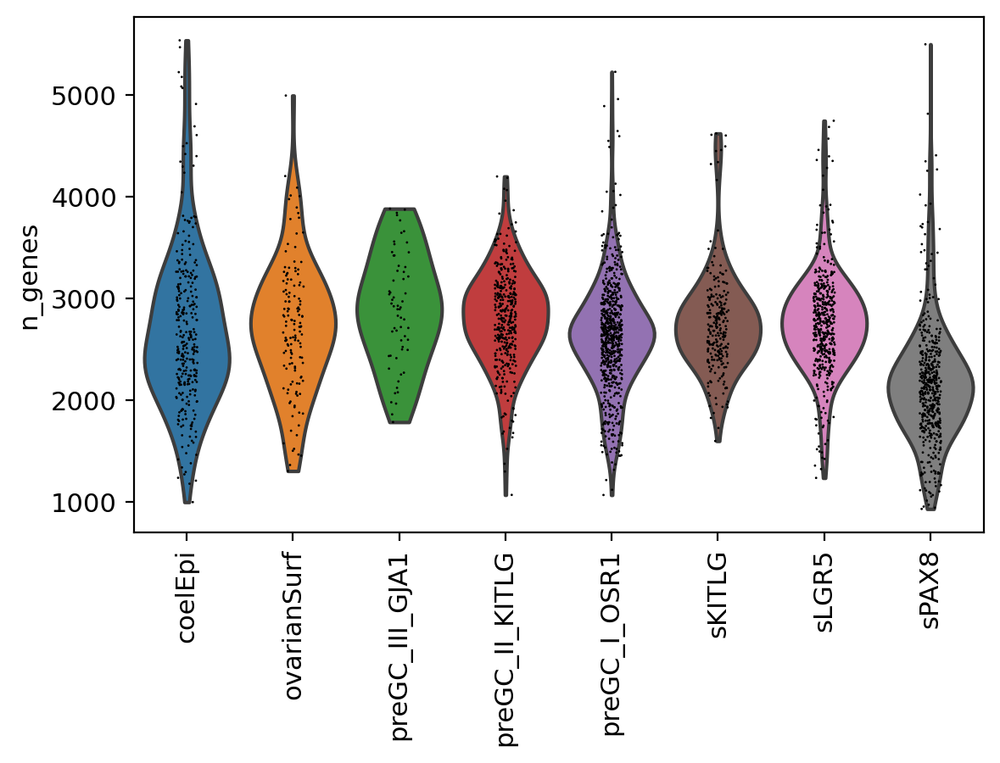

In [272]:
sc.pl.violin(adata, keys = 'n_genes', groupby = 'annotated_clusters', rotation=90)

In [273]:
# Shall we filter cells?
sc.pp.filter_cells(adata, min_genes=300)

# Get UMAP for cells of interest

In [274]:
sc.pp.filter_genes(adata, min_cells=3)
adata.raw = adata.copy()
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

Total number of cells: 2736
Total number of genes: 2636


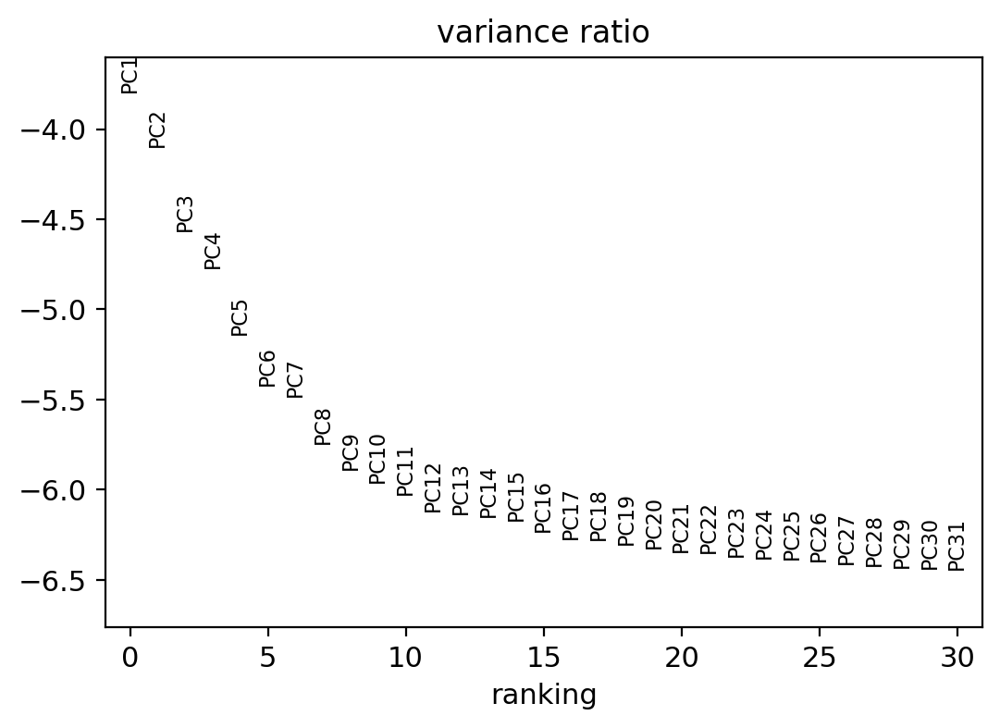

In [275]:
bdata = adata.copy()
sc.pp.highly_variable_genes(bdata)
for col in ['highly_variable','means', 'dispersions', 'dispersions_norm']:
    adata.var[col] = bdata.var[col]
bdata = bdata[:, bdata.var['highly_variable']]
print('Total number of cells: {:d}'.format(bdata.n_obs))
print('Total number of genes: {:d}'.format(bdata.n_vars))
sc.pp.scale(bdata, max_value=10)
sc.tl.pca(bdata, svd_solver='arpack', n_comps=50)
#fill NaNs with False so that subsetting to HVGs is possible
adata.var['highly_variable'].fillna(value=False, inplace=True)
adata.obsm['X_pca'] = bdata.obsm['X_pca'].copy()
adata.uns['pca'] = bdata.uns['pca'].copy()
adata.varm['PCs'] = np.zeros(shape=(adata.n_vars, 50))
adata.varm['PCs'][adata.var['highly_variable']] = bdata.varm['PCs']
sc.pl.pca_variance_ratio(adata, log=True, save='.pdf')

In [276]:
sc.pp.scale(adata, max_value=10)

In [277]:
n_pcs = 7
sc.pp.neighbors(adata, n_pcs = n_pcs, random_state=1)
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=0.4)

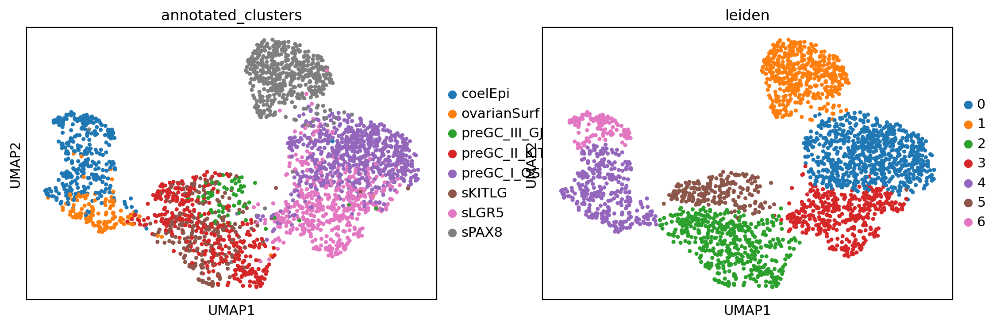

In [278]:
sc.pl.umap(adata, color=['annotated_clusters', 'leiden'])

... storing 'clusters' as categorical


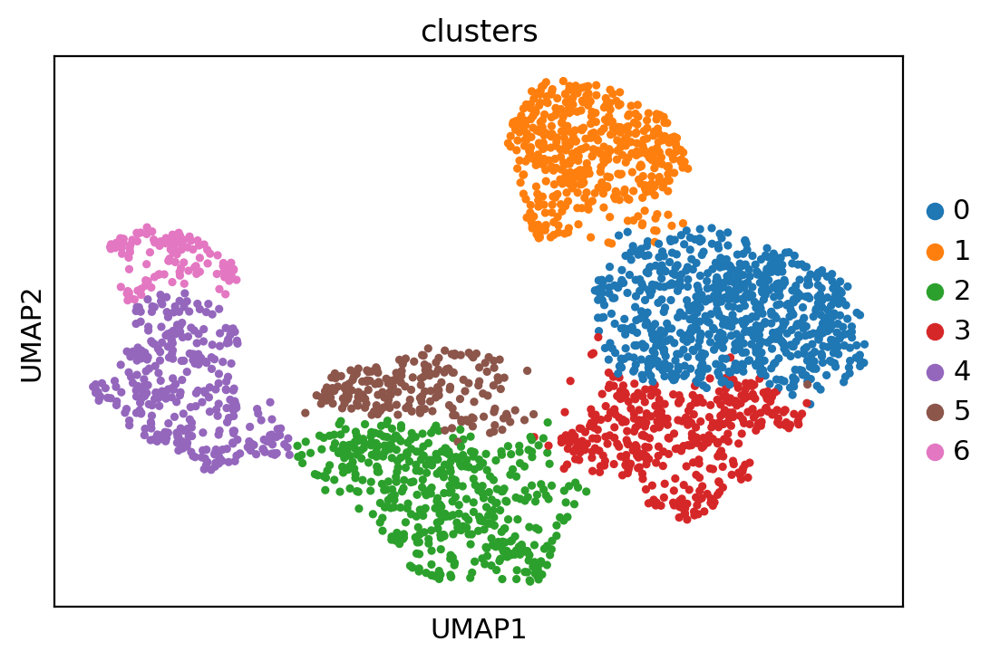

In [279]:
adata.obs['clusters'] = adata.obs['leiden'].tolist()
# adata.obs.at[adata.obs['clusters'] == '0', 'clusters'] = 'preGC_I_OSR1'
# adata.obs.at[adata.obs['clusters'] == '1', 'clusters'] = 'sPAX8'
# adata.obs.at[adata.obs['clusters'] == '2', 'clusters'] = 'preGC_I_OSR1'
# adata.obs.at[adata.obs['clusters'] == '3', 'clusters'] = 'sKITLG'
# adata.obs.at[adata.obs['clusters'] == '4', 'clusters'] = 'OSE'
# adata.obs.at[adata.obs['clusters'] == '5', 'clusters'] = 'preGC_II_KITLG'
# adata.obs.at[adata.obs['clusters'] == '6', 'clusters'] = 'coelEpi'
# adata.obs.at[adata.obs['clusters'] == '7', 'clusters'] = 'sLGR5'
# set(adata.obs['clusters'])
# sc.pl.umap(adata, color=['clusters'])
# adata.obs['clusters'].cat.reorder_categories(['coelEpi','OSE', 'sKITLG', 'preGC_II_KITLG',
#                                              'sLGR5', 'preGC_I_OSR1', 'sPAX8'], inplace=True)

sc.pl.umap(adata, color=['clusters'])

# Load velocyto results

In [280]:
path = '/nfs/users/nfs_l/lg18/team292/lg18/gonads/data/scRNAseq/FCA/rawdata/'
samples = [sample+'_velo']
adataV = scv.read(path+samples[0]+'/velocyto/'+samples[0]+'.loom', cache=True)
scv.utils.show_proportions(adataV)
adataV

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Abundance of ['spliced', 'unspliced']: [0.76 0.24]


AnnData object with n_obs × n_vars = 7006 × 36601
    obs: 'Clusters', '_X', '_Y'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

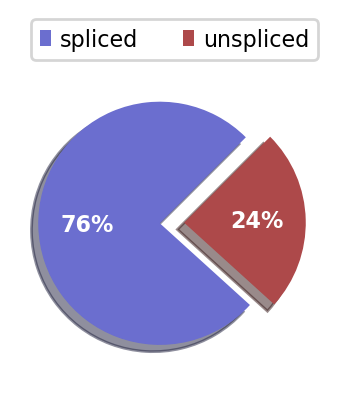

In [281]:
scv.pl.proportions(adataV)

In [282]:
# Format cell sample id and use as index
adataV.obs['sample'] = adataV.obs.index
adataV.obs['sample'] = [i.replace('_all', '')  for i in adataV.obs['sample']]
adataV.obs['sample'] = [i.replace('x', '')  for i in adataV.obs['sample'] ]
adataV.obs['sample'] = [i.replace(':', '_')  for i in adataV.obs['sample']]
adataV.obs.index = adataV.obs['sample'] 

# Merge info and process

In [283]:
adataN = scv.utils.merge(adata, adataV)
# adataN.obs_names = [ i.decode("utf-8") for i in adataN.obs_names ]
# adataN.var_names = [ i.decode("utf-8") for i in adataN.var_names ]

print('Total number of cells: {:d}'.format(adataN.n_obs))
print('Total number of genes: {:d}'.format(adataN.n_vars))
scv.utils.show_proportions(adataN)

Total number of cells: 2736
Total number of genes: 18171
Abundance of ['spliced', 'unspliced']: [0.75 0.25]


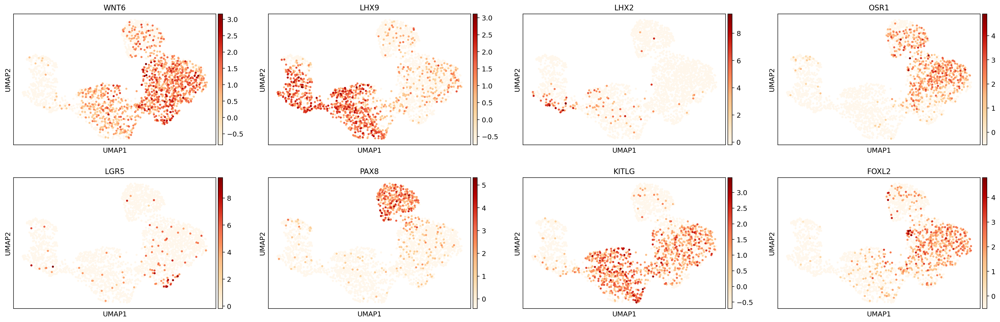

In [284]:
sc.pl.umap(adata, color=["WNT6", "LHX9", 'LHX2', 'OSR1', 'LGR5', 'PAX8', 'KITLG', 'FOXL2'], color_map='OrRd', use_raw=False)

In [285]:
# compute first and second order moments (means and uncentered variances) computed among nearest neighbors in PCA space,
scv.pp.moments(adataN, n_pcs=n_pcs, use_highly_variable=True)

Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


# Dynamical velocity

In [286]:
scv.tl.velocity(adataN, mode='dynamical')
scv.tl.velocity_graph(adataN)

computing velocities
    finished (0:00:03) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:02) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


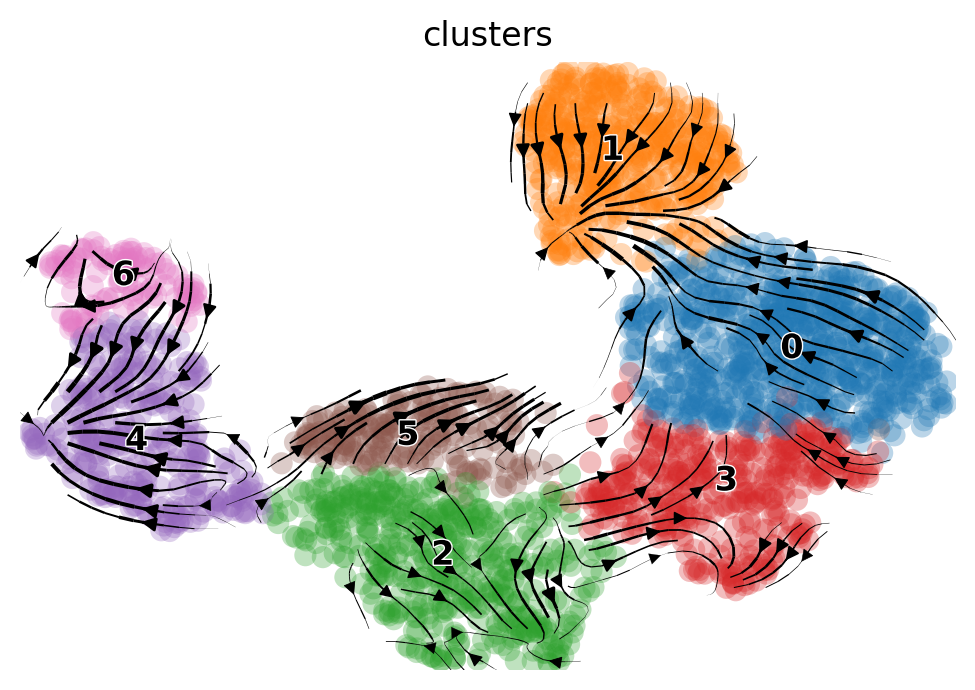

In [287]:
scv.pl.velocity_embedding_stream(adataN, basis='umap', color='clusters')

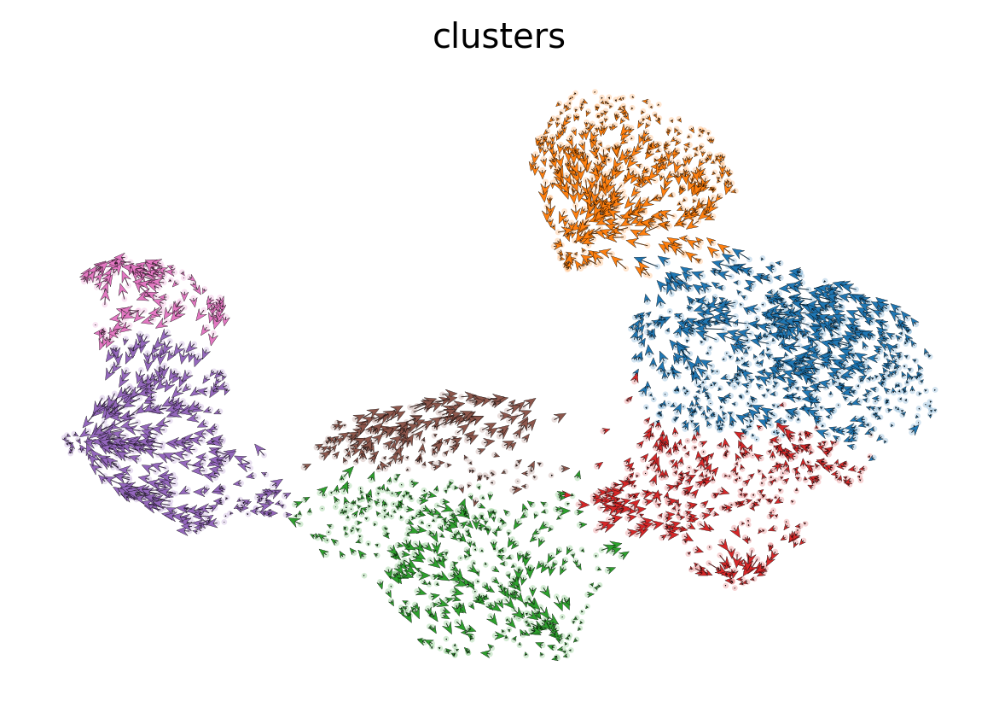

In [288]:
scv.pl.velocity_embedding(adataN, arrow_length=3, arrow_size=2, dpi=120)

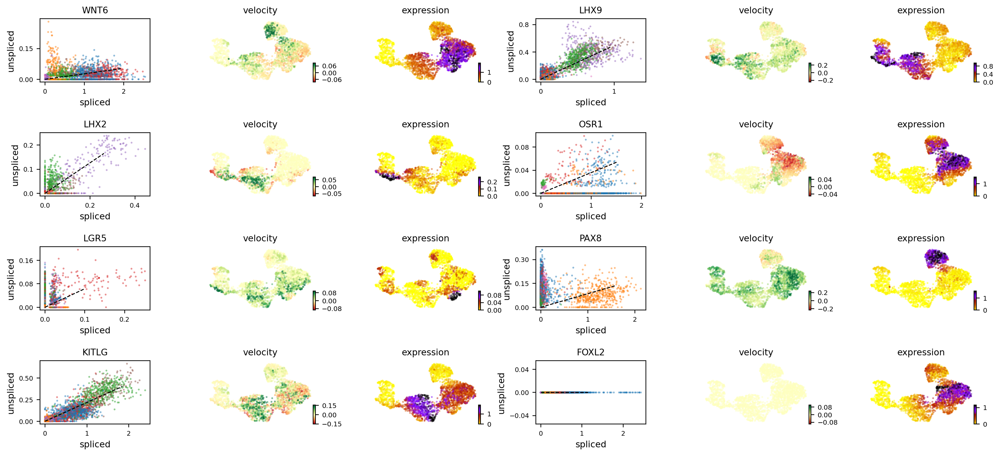

In [289]:
scv.pl.velocity(adataN, var_names=["WNT6", "LHX9", 'LHX2', 'OSR1', 'LGR5', 'PAX8', 'KITLG', 'FOXL2'], ncols=2)

# Identify important genes

In [290]:
scv.tl.rank_velocity_genes(adataN, groupby='clusters', min_corr=.3)

df = scv.DataFrame(adataN.uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes
    finished (0:00:12) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,0,1,2,3,4,5,6
0,ZNRF3,TBX1,COL11A1,GRID2,CNTN4,CDH8,LGALS2
1,ATXN1,SLIT1,ZFAND2A,SYNDIG1,CDH7,LSAMP,MMP23B
2,PLEKHH2,PTGDS,PCDH17,CNTN1,NHSL1,RELN,CNTN4
3,NRXN3,NHS,UNC5D,NPY1R,BNC2,CSMD3,SPARC
4,SULF1,FAH,CKS2,TAC1,CDH11,AC092691.1,CRIP1


In [291]:
# kwargs = dict(frameon=False, size=10, linewidth=1.5,
#               add_outline='PGC, oogonia_STRA8, oogonia_meiosis, oocyte')

# scv.pl.scatter(adataN, df['PGC'][:5], ylabel='PGC', **kwargs)
# scv.pl.scatter(adataN, df['oogonia_STRA8'][:5], ylabel='oogonia_STRA8', **kwargs)
# scv.pl.scatter(adataN, df['oogonia_meiosis'][:5], ylabel='oogonia_meiosis', **kwargs)
# scv.pl.scatter(adataN, df['oocyte'][:5], ylabel='oocyte', **kwargs)

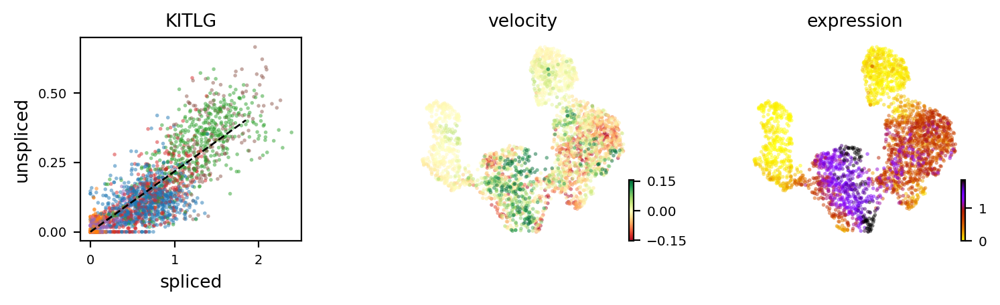

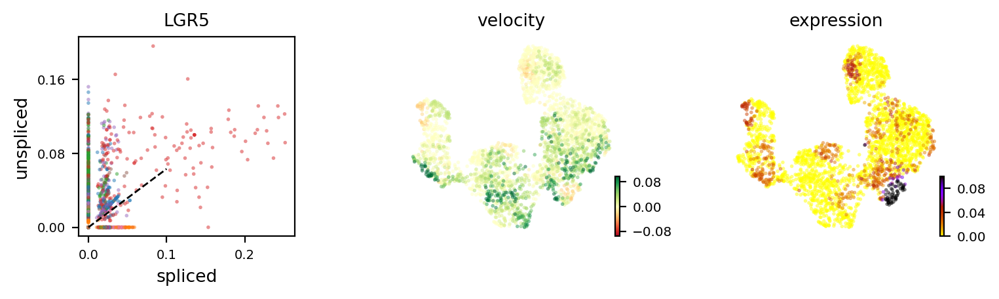

In [292]:
scv.pl.velocity(adataN, var_names=["KITLG"], ncols=2)
scv.pl.velocity(adataN, var_names=["LGR5"], ncols=2)

# Velocities in cycling progenitors

calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


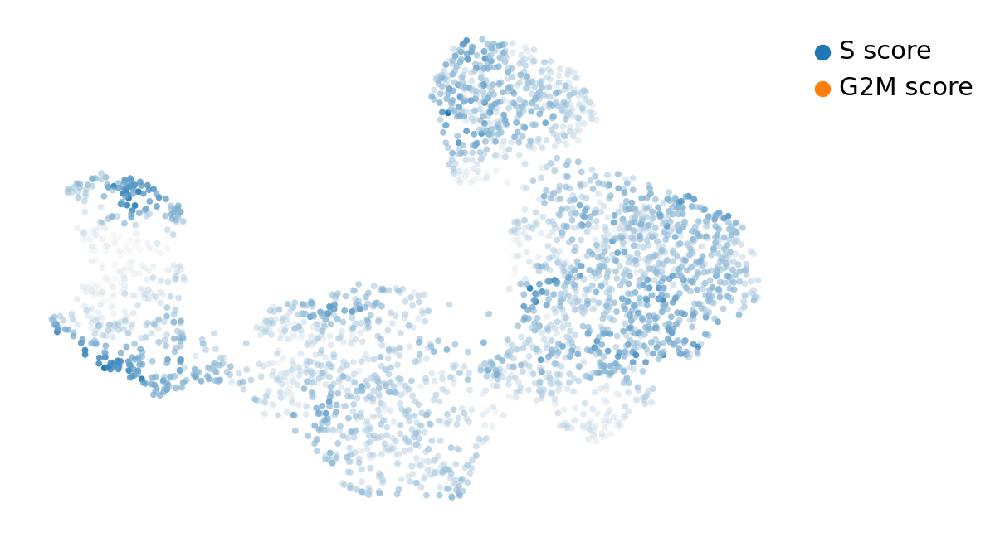

In [293]:
scv.tl.score_genes_cell_cycle(adataN)
scv.pl.scatter(adataN, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95])


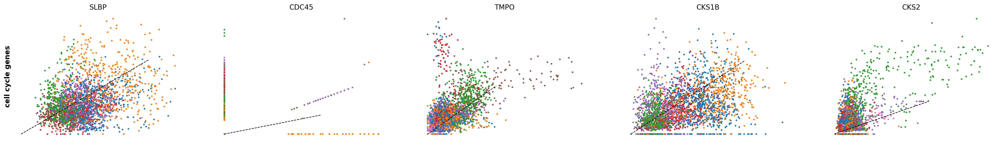

In [294]:
s_genes, g2m_genes = scv.utils.get_phase_marker_genes(adataN)
s_genes = scv.get_df(adataN[:, s_genes], 'spearmans_score', sort_values=True).index
g2m_genes = scv.get_df(adataN[:, g2m_genes], 'spearmans_score', sort_values=True).index

kwargs = dict(frameon=False, ylabel='cell cycle genes')
scv.pl.scatter(adataN, list(s_genes[:2]) + list(g2m_genes[:3]), **kwargs)


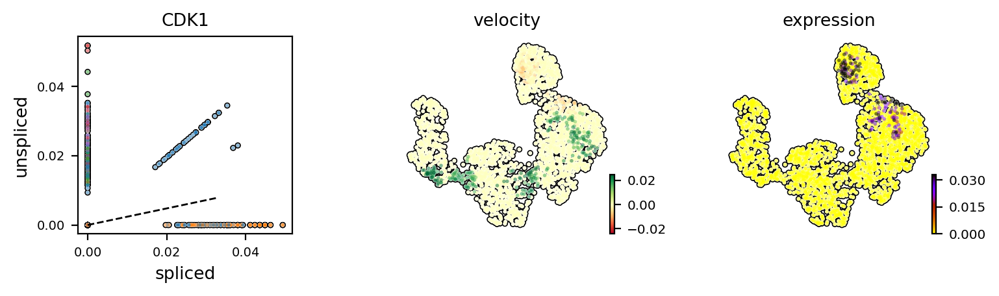

In [295]:
scv.pl.velocity(adataN, ["CDK1"], ncols=2, add_outline=True)

# Speed and coherence

The speed or rate of differentiation is given by the length of the velocity vector. - The coherence of the vector field (i.e., how a velocity vector correlates with its neighboring velocities) provides a measure of confidence.

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


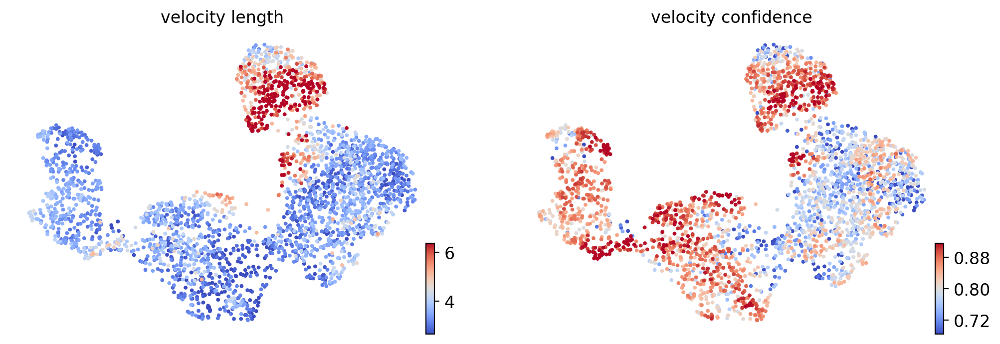

In [296]:
scv.tl.velocity_confidence(adataN)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adataN, c=keys, cmap='coolwarm', perc=[5, 95])

In [297]:
df = adataN.obs.groupby('clusters')[keys].mean().T
df.style.background_gradient(cmap='coolwarm', axis=1)

clusters,0,1,2,3,4,5,6
velocity_length,3.55,5.72,3.15,3.43,3.55,3.65,3.14
velocity_confidence,0.77,0.85,0.84,0.77,0.86,0.85,0.85


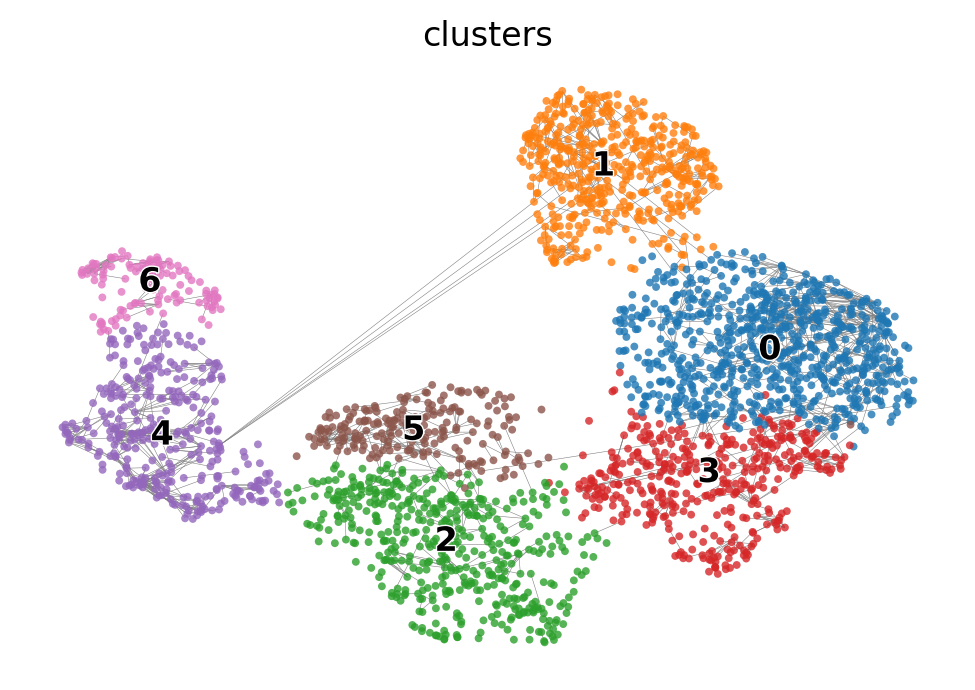

In [298]:
adataN.obs['clusters'] = adataN.obs['clusters']
scv.pl.velocity_graph(adataN, threshold=.3)

draw descendents/anscestors coming from a specified cell

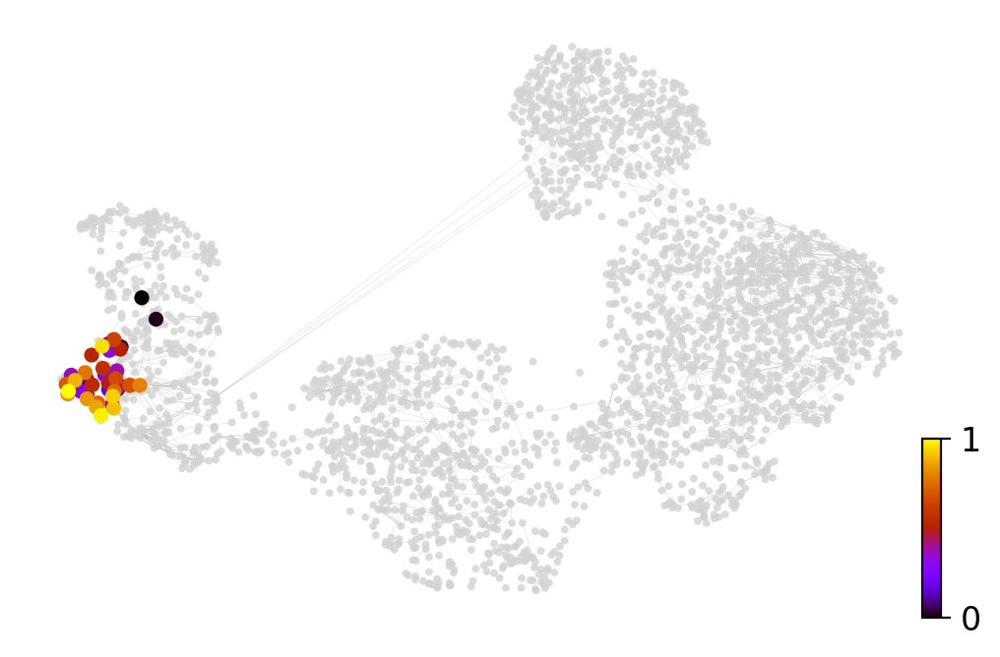

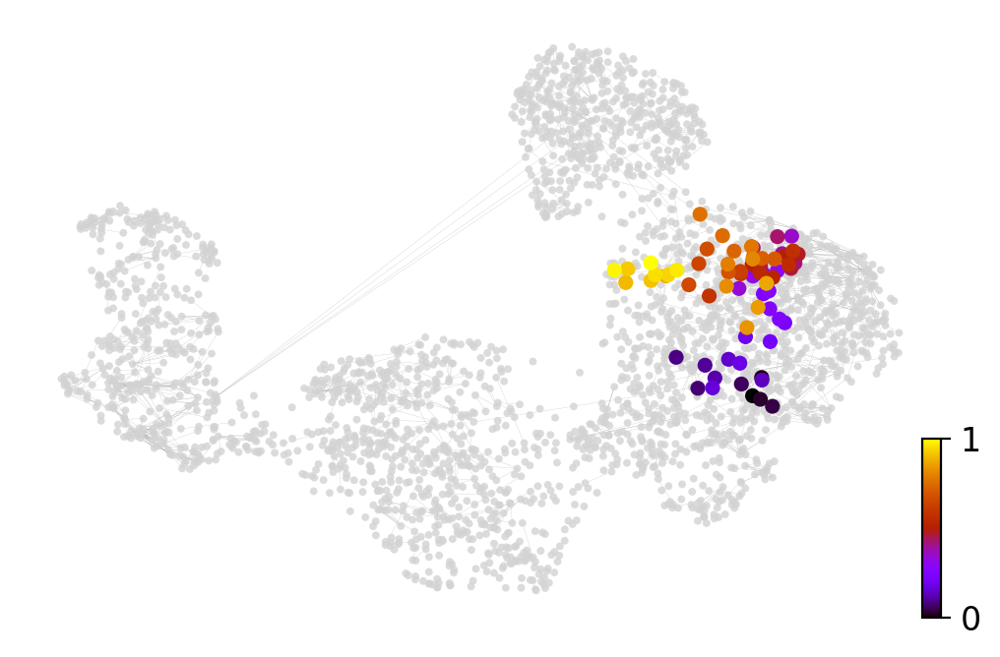

In [299]:
x, y = scv.utils.get_cell_transitions(adataN, basis='umap', starting_cell=1)
ax = scv.pl.velocity_graph(adataN, c='lightgrey', edge_width=.05, show=False, threshold=.3)
ax = scv.pl.scatter(adataN, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

x, y = scv.utils.get_cell_transitions(adataN, basis='umap', starting_cell=100)
ax = scv.pl.velocity_graph(adataN, c='lightgrey', edge_width=.05, show=False, threshold=.3)
ax = scv.pl.scatter(adataN, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

computing terminal states
    identified 0 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


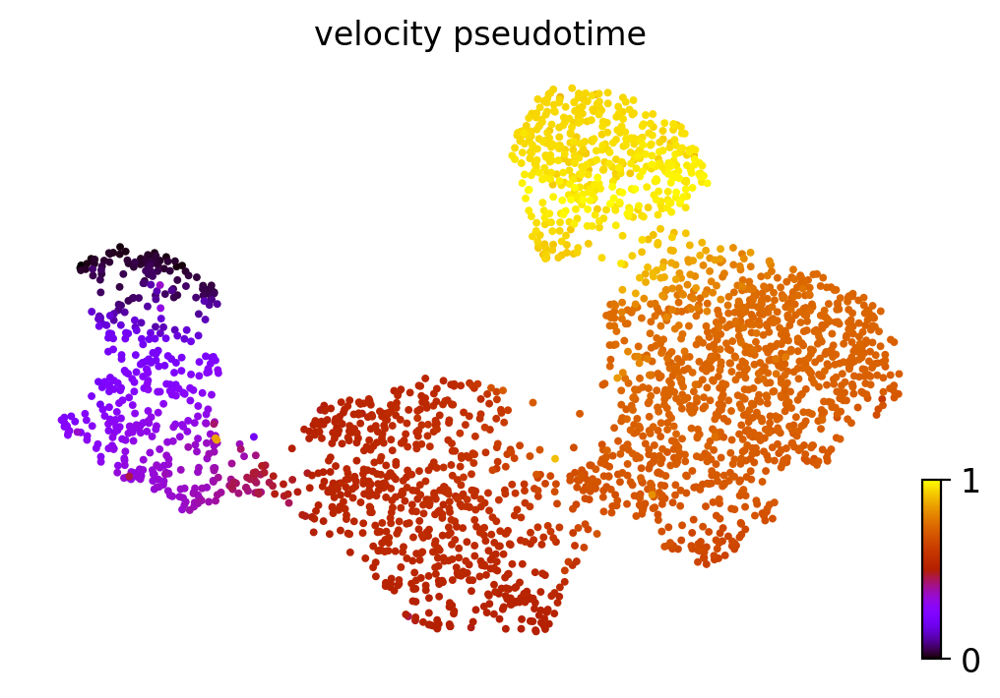

In [300]:
scv.tl.velocity_pseudotime(adataN)
scv.pl.scatter(adataN, color='velocity_pseudotime', cmap='gnuplot')

In [301]:
# PAGA requires to install igraph, if not done yet.
!pip install python-igraph --upgrade --quiet


In [302]:
# this is needed due to a current bug - bugfix is coming soon.
adataN.uns['neighbors']['distances'] = adataN.obsp['distances']
adataN.uns['neighbors']['connectivities'] = adataN.obsp['connectivities']

scv.tl.paga(adataN, groups='clusters')
df = scv.get_df(adataN, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')



running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,0,1,2,3,4,5,6
0,0,0.18,0,0,0,0,0
1,0,0,0,0,0,0,0
2,0,0,0,0.11,0,0,0
3,0.67,0,0,0,0,0,0
4,0,0,0.05,0,0,0.084,0
5,0,0,0,0,0,0,0
6,0,0,0,0,0.23,0,0


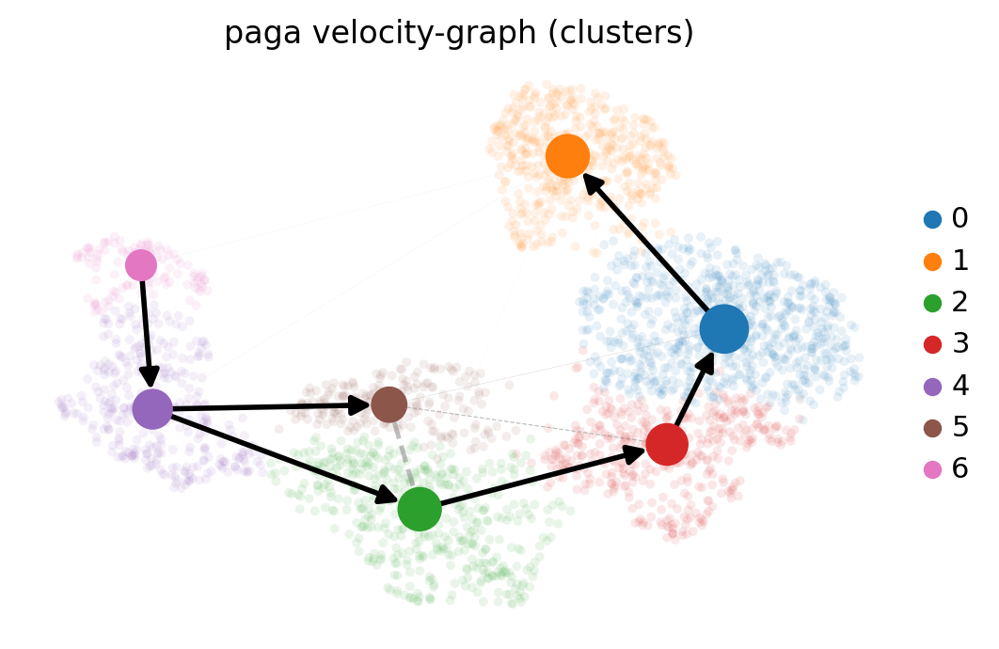

In [305]:
scv.pl.paga(adataN, basis='umap', size=50, alpha=.1, threshold=0,
            min_edge_width=2, node_size_scale=1.5)

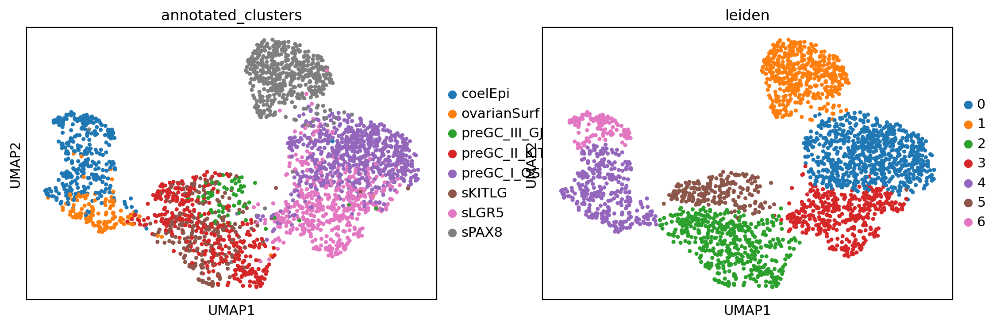

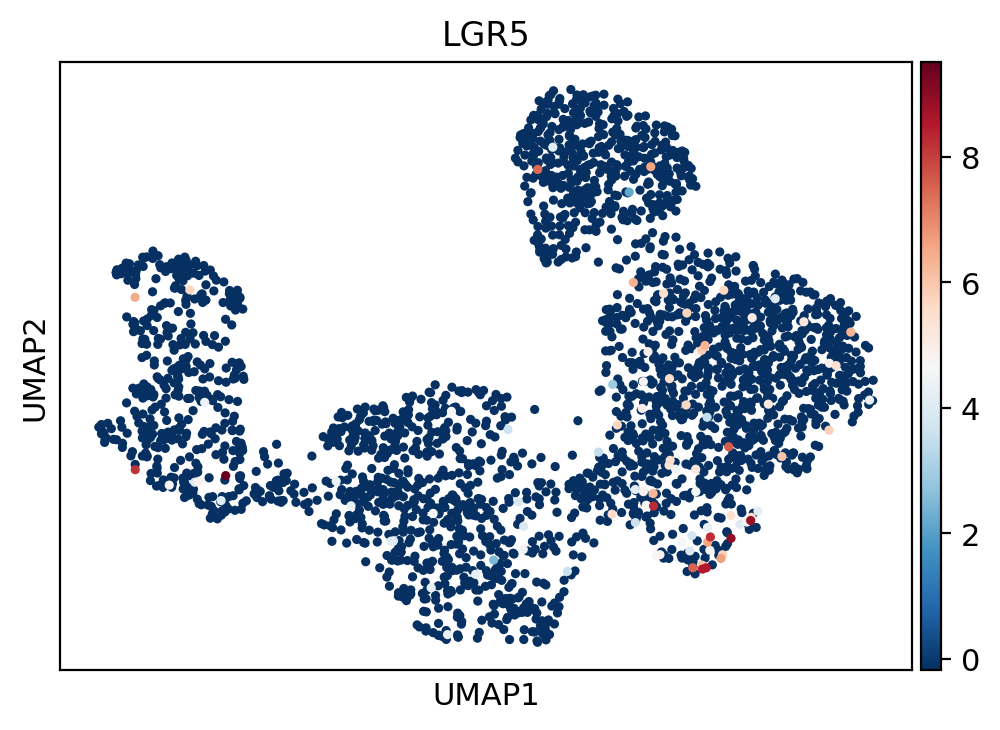

In [304]:
sc.pl.umap(adata, color=['annotated_clusters', 'leiden'])
sc.pl.umap(adata, color=['LGR5'], use_raw=False)